# Setup

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
mount = ''

In [2]:
from sklearn.model_selection import train_test_split

In [3]:
!pip install pillow-heif

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 30.7 MB/s eta 0:00:00


In [4]:
from PIL import Image, ImageOps, UnidentifiedImageError
from pillow_heif import register_heif_opener
register_heif_opener()

from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [5]:
import numpy as np
from tqdm import tqdm
import os
import pandas as pd
import random
from typing import List, Optional, Tuple, Dict, Any, Union, Callable

In [6]:
import shutil

In [7]:
import warnings
from pandas.errors import SettingWithCopyWarning
warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)

In [8]:
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
sns.set_theme()

Set random seed values for reproducibility

In [9]:
seed_val = 17

random.seed(seed_val)
np.random.seed(seed_val)

# Data

## Read metadata from disk

In [19]:
station_names = ['Hauptbahnhof', 'Stadtmitte', 'Feuersee', 'Schwabstrasse', 'University']

In [20]:
data_dir = f'{mount}/data'

In [21]:
os.listdir(data_dir)

['Anna', 'Beate', 'Berkay']

In [22]:
df = []
file_types = ['raw']  # raw, processed
st_name_vis_options = ['st_name', 'no_st_name']  # station name visibility

for author in os.listdir(data_dir):
  for file_type in file_types:
    for station in station_names:
      for st_name_vis in st_name_vis_options:
        for f in os.listdir(f'{data_dir}/{author}/{file_type}/{station}/{st_name_vis}'):
          df.append((station, author, file_type, st_name_vis, f,
                     f'{author}/{file_type}/{station}/{st_name_vis}/{f}'))

df = pd.DataFrame(df, columns=['station', 'author', 'file_type',
                               'st_name_visible', 'filename', 'file_path'])

# ensures correct order of appearance in plots
df['station'] = pd.Categorical(df['station'], ordered=True,
                categories=['Hauptbahnhof', 'Stadtmitte', 'Feuersee', 'Schwabstrasse', 'University'])

df['st_name_visible'] = df['st_name_visible'].replace({'st_name': True, 'no_st_name': False})
df['st_name_visible'] = pd.Categorical(df['st_name_visible'], ordered=True, categories=[True, False])

df.head()

/tmp/ipython-input-22-3881505212.py:20: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['st_name_visible'] = df['st_name_visible'].replace({'st_name': True, 'no_st_name': False})


,station,author,file_type,st_name_visible,filename,file_path
0,Stadtmitte,Anna,raw,True,20250513_132112.jpg,Anna/raw/Stadtmitte/st_name/20250513_132112.jpg
1,Stadtmitte,Anna,raw,True,20250512_132302.jpg,Anna/raw/Stadtmitte/st_name/20250512_132302.jpg
2,Stadtmitte,Anna,raw,True,20250512_132259.jpg,Anna/raw/Stadtmitte/st_name/20250512_132259.jpg
3,Stadtmitte,Anna,raw,True,20250512_132258.jpg,Anna/raw/Stadtmitte/st_name/20250512_132258.jpg
4,Stadtmitte,Anna,raw,True,20250512_132243.jpg,Anna/raw/Stadtmitte/st_name/20250512_132243.jpg


In [23]:
df.shape

(216, 6)

Keep correctly labeled images

In [26]:
df = df[df['station'].isin(station_names)]
df.shape

(216, 6)

Picture author (camera) distribution

In [25]:
df['author'].value_counts()

,count
author,
Beate,89
Anna,66
Berkay,61


## Station distribution

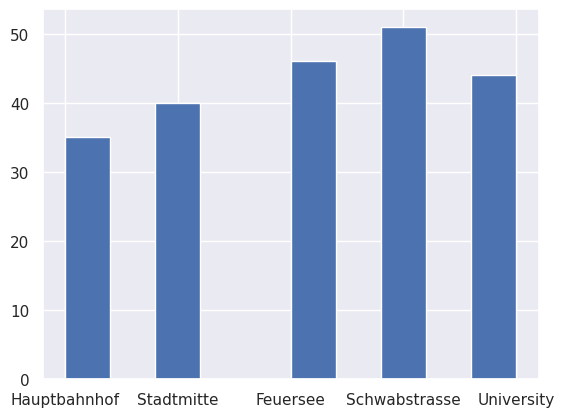

In [34]:
df['station'].sort_values().hist();

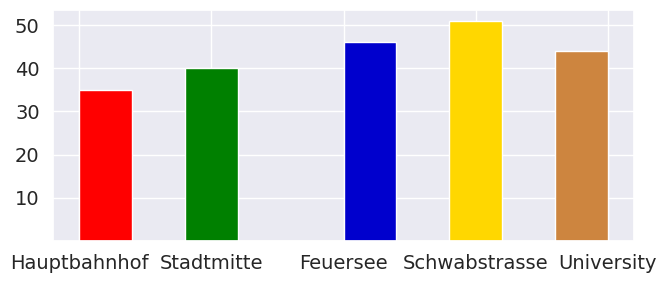

In [35]:
ax = df['station'].sort_values().hist(figsize=(7.5, 3))
ax.patches[0].set_facecolor('red')      # hauptbahnhof
ax.patches[2].set_facecolor('green')    # stadtmitte
ax.patches[5].set_facecolor('mediumblue')     # feuersee
ax.patches[7].set_facecolor('gold')     # schwabstrasse
ax.patches[9].set_facecolor('peru')     # university
ax.tick_params(labelsize=14);
ax.set_yticks([0, 10, 20, 30, 40, 50], ['', 10, 20, 30, 40, 50]);

## Station name visibility

In [ ]:
df['st_name_visible'].value_counts()

,count
st_name_visible,
True,115
False,101


In [ ]:
df.groupby('station')['st_name_visible'].value_counts()

/tmp/ipython-input-22-2779069449.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby('station')['st_name_visible'].value_counts()


station        st_name_visible
Hauptbahnhof   True               18
               False              17
Stadtmitte     True               30
               False              10
Feuersee       False              31
               True               15
Schwabstrasse  False              28
               True               23
University     True               29
               False              15
Name: count, dtype: int64

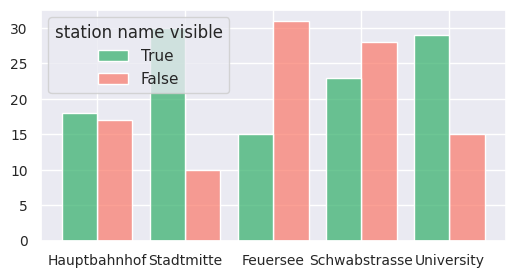

In [54]:
plt.figure(figsize=(6, 3));
ax = sns.histplot(data=df.sort_values(by='st_name_visible', ascending=False),
             x='station', hue='st_name_visible', multiple="dodge", shrink=.8,
             palette=['mediumseagreen', 'salmon']);
plt.tick_params(labelsize=10);
plt.xlabel('');
plt.ylabel('');
ax.get_legend().set_title('station name visible');

## Filter data

In [ ]:
# drop Hauptbahnhof
station_names = ['Stadtmitte', 'Feuersee', 'Schwabstrasse', 'University']
df = df[df['station'] != 'Hauptbahnhof']
df.shape

(181, 6)

# Data split

Generate hard train / val / test split
* train - 70%
* val - 10%
* test - 20%

## Split dataframe

Check that filename is a unique image identifier

In [ ]:
df['filename'].nunique(), df.shape[0]

(216, 216)

In [ ]:
# train / val / test -- 0.7 / 0.1 / 0.2
test_size, val_size = round(df.shape[0] * 0.2), round(df.shape[0] * 0.1)

In [ ]:
df_train, df_test = train_test_split(df, test_size=test_size)
df_train, df_val = train_test_split(df_train, test_size=val_size)

df_train = df_train.reset_index(drop=True)
df_val = df_val.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

len(df_train), len(df_val), len(df_test)

(151, 22, 43)

In [ ]:
df_train.head()

,station,author,file_type,st_name_visible,filename,file_path
0,University,Anna,raw,True,uni_name_5.png,Anna/raw/University/st_name/uni_name_5.png
1,Schwabstrasse,Beate,raw,False,20250502_142758.jpg,Beate/raw/Schwabstrasse/no_st_name/20250502_14...
2,Feuersee,Anna,raw,False,f_no_name_3.png,Anna/raw/Feuersee/no_st_name/f_no_name_3.png
3,Stadtmitte,Anna,raw,False,20250506_111040.jpg,Anna/raw/Stadtmitte/no_st_name/20250506_111040...
4,Stadtmitte,Anna,raw,True,20250512_132259.jpg,Anna/raw/Stadtmitte/st_name/20250512_132259.jpg


## Create dataset folder

Create subfolders

In [ ]:
ds_version = '5'  # 4 classes w/o Hbf, 5 classes with
dataset_dir = f'{mount}/dataset/dataset_{ds_version}'
dataset_dir

'/content/drive/MyDrive/Uni Stuttgart/AACV/dataset/dataset_5'

In [ ]:
os.makedirs(dataset_dir)

In [ ]:
os.makedirs(f'{dataset_dir}/train/images')
os.makedirs(f'{dataset_dir}/val/images')
os.makedirs(f'{dataset_dir}/test/images')

Copy images from main data folder

In [ ]:
for file_path, filename in zip(df_train['file_path'], df_train['filename']):
  shutil.copy(f'{data_dir}/{file_path}', f'{dataset_dir}/train/images/{filename}')

for file_path, filename in zip(df_val['file_path'], df_val['filename']):
  shutil.copy(f'{data_dir}/{file_path}', f'{dataset_dir}/val/images/{filename}')

for file_path, filename in zip(df_test['file_path'], df_test['filename']):
  shutil.copy(f'{data_dir}/{file_path}', f'{dataset_dir}/test/images/{filename}')

Check number of images

In [ ]:
print(len(os.listdir(f'{dataset_dir}/train/images')), df_train.shape[0])
print(len(os.listdir(f'{dataset_dir}/val/images')), df_val.shape[0])
print(len(os.listdir(f'{dataset_dir}/test/images')), df_test.shape[0])

151 151
22 22
43 43


Save dataframes

In [ ]:
df_train['file_path'] = df_train['filename'].apply(lambda x: f'train/images/{x}')
df_val['file_path'] = df_val['filename'].apply(lambda x: f'val/images/{x}')
df_test['file_path'] = df_test['filename'].apply(lambda x: f'test/images/{x}')

In [ ]:
df_train.to_csv(f'{dataset_dir}/train/df_train.csv', index=False)
df_val.to_csv(f'{dataset_dir}/val/df_val.csv', index=False)
df_test.to_csv(f'{dataset_dir}/test/df_test.csv', index=False)

# Station name test set

Separate a subset of the test set of only those images where the station name is visible

## 4 classes

In [ ]:
df_test['st_name_visible'].value_counts()

,count
st_name_visible,
True,26
False,17


In [ ]:
df_test_st_name = df_test[df_test['st_name_visible']]
df_test_st_name.shape

(26, 6)

In [ ]:
df_test_st_name['station'].value_counts()

,count
station,
Stadtmitte,10
Hauptbahnhof,5
Schwabstrasse,4
University,4
Feuersee,3


Create subfolders

In [ ]:
os.makedirs(f'{dataset_dir}/test_st_name')
os.makedirs(f'{dataset_dir}/test_st_name/st_name_visible/images')
os.makedirs(f'{dataset_dir}/test_st_name/st_name_masked/images')

Copy images

In [ ]:
for filename in df_test_st_name['filename']:
  shutil.copy(f'{dataset_dir}/test/images/{filename}',
              f'{dataset_dir}/test_st_name/st_name_visible/images/{filename}')

Save dataframes

In [ ]:
df_test_st_name['file_path'] = df_test_st_name['filename'].apply(
    lambda x: f'test_st_name/st_name_visible/images/{x}')

df_test_st_name['st_name_masked'] = False
df_test_st_name.to_csv(f'{dataset_dir}/test_st_name/st_name_visible/df_test_st_name_visible.csv',
                       index=False)

df_test_st_name['file_path'] = df_test_st_name['filename'].apply(
    lambda x: f'test_st_name/st_name_masked/images/{x}')
df_test_st_name['st_name_masked'] = True
df_test_st_name.to_csv(f'{dataset_dir}/test_st_name/st_name_masked/df_test_st_name_masked.csv',
                       index=False)

## Add Hbf

Create folders

In [ ]:
os.makedirs(f'{dataset_dir}/test_st_name')
os.makedirs(f'{dataset_dir}/test_st_name/st_name_visible/images')
os.makedirs(f'{dataset_dir}/test_st_name/st_name_masked/images')

Read dataframe for 4-class st. name test set (visible)

In [ ]:
ds_4_dir = f'{mount}/dataset/dataset_4'
df_test_st_name = pd.read_csv(f'{ds_4_dir}/test_st_name/st_name_visible/df_test_st_name_visible.csv')
df_test_st_name['station'].value_counts()

,count
station,
University,9
Stadtmitte,5
Schwabstrasse,3
Feuersee,3


Copy 4-class st. name test set

In [ ]:
for filename in df_test_st_name['filename']:
  shutil.copy(f'{ds_4_dir}/test_st_name/st_name_visible/images/{filename}',
              f'{dataset_dir}/test_st_name/st_name_visible/images/{filename}')

for filename in df_test_st_name['filename']:
  shutil.copy(f'{ds_4_dir}/test_st_name/st_name_masked/images/{filename}',
              f'{dataset_dir}/test_st_name/st_name_masked/images/{filename}')

Add hbf pics: create df

In [ ]:
df_test = pd.read_csv(f'{dataset_dir}/test/df_test.csv')

In [ ]:
hbf_st_name = df_test[(df_test['station'] == 'Hauptbahnhof') & (df_test['st_name_visible'])]
hbf_st_name = hbf_st_name.sample(5)
hbf_st_name['st_name_masked'] = False
hbf_st_name = hbf_st_name[['station', 'author', 'file_type', 'st_name_visible', 'filename',
       'st_name_masked', 'file_path']]
hbf_st_name

,station,author,file_type,st_name_visible,filename,st_name_masked,file_path
41,Hauptbahnhof,Berkay,raw,True,IMG_6871.HEIC,False,test/images/IMG_6871.HEIC
0,Hauptbahnhof,Berkay,raw,True,IMG_6867.HEIC,False,test/images/IMG_6867.HEIC
1,Hauptbahnhof,Berkay,raw,True,5ebb528e-7525-4ec2-96fe-53a426c7f50f.jpg,False,test/images/5ebb528e-7525-4ec2-96fe-53a426c7f5...
9,Hauptbahnhof,Berkay,raw,True,IMG_6865.HEIC,False,test/images/IMG_6865.HEIC
3,Hauptbahnhof,Berkay,raw,True,1468dd07-54f5-4e5f-8830-1a7aca5ba146.jpg,False,test/images/1468dd07-54f5-4e5f-8830-1a7aca5ba1...


Copy pics

In [ ]:
for filename in hbf_st_name['filename']:
  shutil.copy(f'{dataset_dir}/test/images/{filename}',
              f'{dataset_dir}/test_st_name/st_name_visible/images/{filename}')

In [ ]:
hbf_st_name['file_path'] = hbf_st_name['filename'].apply(
    lambda x: f'test_st_name/st_name_visible/images/{x}')
df_test_st_name_5 = pd.concat([df_test_st_name, hbf_st_name]).reset_index(drop=True)
df_test_st_name_5

,station,author,file_type,st_name_visible,filename,st_name_masked,file_path
0,University,Beate,raw,True,20250519_130403.jpg,False,test_st_name/st_name_visible/images/20250519_1...
1,University,Beate,raw,True,20250502_130133.jpg,False,test_st_name/st_name_visible/images/20250502_1...
2,Schwabstrasse,Beate,raw,True,20250417_111132.jpg,False,test_st_name/st_name_visible/images/20250417_1...
3,Stadtmitte,Anna,raw,True,20250508_133817.jpg,False,test_st_name/st_name_visible/images/20250508_1...
4,University,Beate,raw,True,20250520_132914.jpg,False,test_st_name/st_name_visible/images/20250520_1...
5,Stadtmitte,Beate,raw,True,20250424_121641.jpg,False,test_st_name/st_name_visible/images/20250424_1...
6,Stadtmitte,Beate,raw,True,20250502_113659.jpg,False,test_st_name/st_name_visible/images/20250502_1...
7,Feuersee,Anna,raw,True,f_name_1.png,False,test_st_name/st_name_visible/images/f_name_1.png
8,Schwabstrasse,Anna,raw,True,schwab_name_3.png,False,test_st_name/st_name_visible/images/schwab_nam...
9,University,Anna,raw,True,20250512_130908.jpg,False,test_st_name/st_name_visible/images/20250512_1...


Save df

In [ ]:
df_test_st_name_5.to_csv(f'{dataset_dir}/test_st_name/st_name_visible/df_test_st_name_visible.csv',
                       index=False)

df_test_st_name_5['st_name_masked'] = True
df_test_st_name_5.to_csv(f'{dataset_dir}/test_st_name/st_name_masked/df_test_st_name_masked.csv',
                       index=False)

# How to read dataset

In [ ]:
ds_version = '4'  # 4 classes w/o Hbf
dataset_dir = f'{mount}/dataset/dataset_{ds_version}'
dataset_dir

'/content/drive/MyDrive/Uni Stuttgart/AACV/dataset/dataset_4'

Read dataframe

In [ ]:
df_train = pd.read_csv(f'{dataset_dir}/train/df_train.csv')  # provide path to dataframe
df_train.head()

,station,author,file_type,st_name_visible,filename
0,University,Beate,raw,True,20250502_124243.jpg
1,Schwabstrasse,Beate,raw,False,20250417_111124.jpg
2,University,Berkay,raw,False,IMG_6732.HEIC
3,Schwabstrasse,Beate,raw,False,20250502_142755.jpg
4,Stadtmitte,Beate,raw,True,20250501_233637.jpg


Read one image

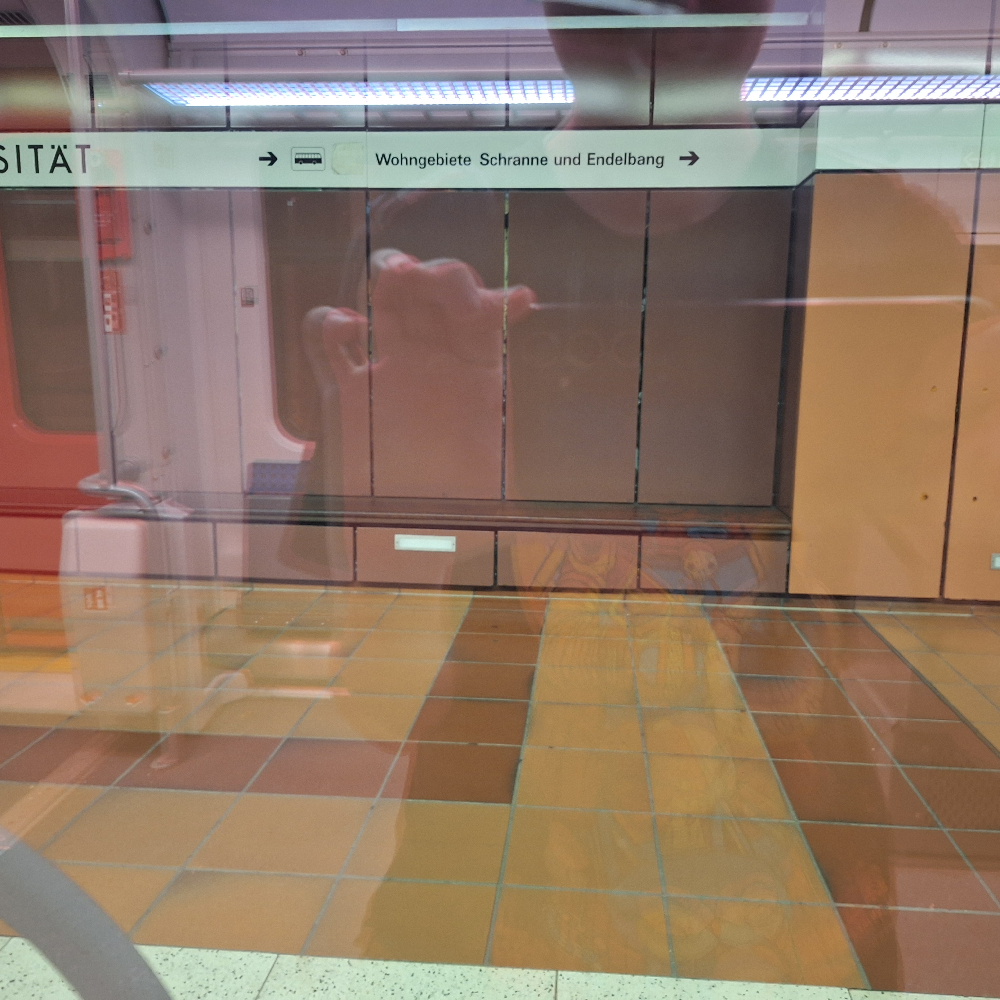

In [ ]:
Image.open(f'{dataset_dir}/train/images/20250502_124243.jpg')

Create torch dataset

In [ ]:
# same dataset definition as before
from torch.utils.data import Dataset

class ImageDataset(Dataset):

    def __init__(self, data_dir, df, transform=None, prompt=None):
        self.data_dir = data_dir
        self.df = df
        self.transform = transform
        self.prompt = prompt

        #TODO: trial read through of all images

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, ind):
        item_metadata = self.df.iloc[ind].to_dict()
        text = item_metadata['station']
        if self.prompt:
          text = self.prompt.format(text)

        image_filepath = f"{self.data_dir}/{item_metadata['file_path']}"
        image = Image.open(image_filepath)
        if self.transform:
          image = self.transform(image)
        return image, text

In [ ]:
train_dataset = ImageDataset(
    data_dir=dataset_dir,   # same for all subsets, don't need to change this
    df=df_train,            # specify dataframe
    transform=None,         # use transform and prompt specific to your model if needed
    prompt=None)